In [2]:
# Importing necessary libraries
import Augmentor
from imgaug import augmenters as iaa
import numpy as np
import os
import glob
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import pickle

from keras.utils import to_categorical
from keras.layers import Dense, Input, Conv2D, Flatten, MaxPool2D, Activation,Dropout
from keras.models import Model
from keras.callbacks import ModelCheckpoint
from keras import backend as K
from keras.preprocessing.image import ImageDataGenerator

In [3]:
# Declaring constants
FIG_WIDTH=20 # Width of figure
HEIGHT_PER_ROW=3 # Height of each row when showing a figure which consists of multiple rows
RESIZE_DIM=48 # The images will be resized to 48x48 pixels

# Setup path variables


In [4]:
#data_dir='./' # for windows
data_dir=os.path.join('..','/home/hasib/Hasib/Others/NumtaDB_with_aug') # for linux

# Train set paths
paths_train_a=glob.glob(os.path.join(data_dir,'training-a','*.png'))
paths_train_b=glob.glob(os.path.join(data_dir,'training-b','*.png'))
paths_train_e=glob.glob(os.path.join(data_dir,'training-e','*.png'))
paths_train_c=glob.glob(os.path.join(data_dir,'training-c','*.png'))
paths_train_d=glob.glob(os.path.join(data_dir,'training-d','*.png'))
paths_train_all=paths_train_a+paths_train_b+paths_train_c+paths_train_d+paths_train_e

# Test set paths
paths_test_a=glob.glob(os.path.join(data_dir,'testing-a','*.png'))
paths_test_b=glob.glob(os.path.join(data_dir,'testing-b','*.png'))
paths_test_e=glob.glob(os.path.join(data_dir,'testing-e','*.png'))
paths_test_c=glob.glob(os.path.join(data_dir,'testing-c','*.png'))
paths_test_d=glob.glob(os.path.join(data_dir,'testing-d','*.png'))
paths_test_f=glob.glob(os.path.join(data_dir,'testing-f','*.png'))+glob.glob(os.path.join(data_dir,'testing-f','*.JPG'))
paths_test_auga=glob.glob(os.path.join(data_dir,'testing-auga','*.png'))
paths_test_augc=glob.glob(os.path.join(data_dir,'testing-augc','*.png'))
paths_test_all=paths_test_a+paths_test_b+paths_test_c+paths_test_d+paths_test_e+paths_test_f+paths_test_auga+paths_test_augc

# Train set labels
path_label_train_a=os.path.join(data_dir,'training-a.csv')
path_label_train_b=os.path.join(data_dir,'training-b.csv')
path_label_train_e=os.path.join(data_dir,'training-e.csv')
path_label_train_c=os.path.join(data_dir,'training-c.csv')
path_label_train_d=os.path.join(data_dir,'training-d.csv')

# Utility Functions

In [5]:
def get_key(path):
    key=path.split(os.sep)[-1]
    return key

def get_data(paths_img,path_label=None,resize_dim=None):
    
    '''reads images from the filepaths, resizes them (if given), and returns them in a numpy array
    Args:
        paths_img: image filepaths
        path_label: pass image label filepaths while processing training data, defaults to None while processing testing data
        resize_dim: if given, the image is resized to resize_dim x resize_dim (optional)
    Returns:
        X: group of images
        y: categorical true labels
    '''
    
    X=[] # initialize empty list for resized images
    print 
    for i,path in enumerate(paths_img):
        img=cv2.imread(path,cv2.IMREAD_COLOR) # images loaded in color (BGR)
        img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        img = pad_image_for_square( img )
        if resize_dim is not None:
            img=cv2.resize(img,(resize_dim,resize_dim),interpolation=cv2.INTER_AREA) # resize image to 28x28
#         X.append(np.expand_dims(img,axis=2)) # expand image to 28x28x1 and append to the list.
        X.append(img) # expand image to 28x28x1 and append to the list
        # display progress
        if i==len(paths_img)-1:
            end='\n'
        else: end='\r'
        #print('processed {}/{}'.format(i+1,len(paths_img)),end)
    print ('finished!')
    X=np.array(X) # tranform list to numpy array
    if  path_label is None:
        return X
    else:
        df = pd.read_csv(path_label) # read labels
        df=df.set_index('filename') 
        y_label=[df.loc[get_key(path)]['digit'] for path in  paths_img] # get the labels corresponding to the images
        #y=to_categorical(y_label,10) # transfrom integer value to categorical variable
        y = y_label
        return X, y
        
def imshow_group(X,y,y_pred=None,n_per_row=10,phase='processed'):
    '''helper function to visualize a group of images along with their categorical true labels (y) and prediction probabilities.
    Args:
        X: images
        y: categorical true labels
        y_pred: predicted class probabilities
        n_per_row: number of images per row to be plotted
        phase: If the images are plotted after resizing, pass 'processed' to phase argument. 
            It will plot the image and its true label. If the image is plotted after prediction 
            phase, pass predicted class probabilities to y_pred and 'prediction' to the phase argument. 
            It will plot the image, the true label, and it's top 3 predictions with highest probabilities.
    '''
    n_sample=len(X)
    img_dim=X.shape[1]
    j=np.ceil(n_sample/n_per_row)
    fig=plt.figure(figsize=(FIG_WIDTH,HEIGHT_PER_ROW*j))
    for i,img in enumerate(X):
        plt.subplot(j,n_per_row,i+1)
#         img_sq=np.squeeze(img,axis=2)
#         plt.imshow(img_sq,cmap='gray')
        plt.imshow(img)
        if phase=='processed':
            plt.title(np.argmax(y[i]))
        if phase=='prediction':
            top_n=3 # top 3 predictions with highest probabilities
            ind_sorted=np.argsort(y_pred[i])[::-1]
            h=img_dim+4
            for k in range(top_n):
                string='pred: {} ({:.0f}%)\n'.format(ind_sorted[k],y_pred[i,ind_sorted[k]]*100)
                plt.text(img_dim/2, h, string, horizontalalignment='center',verticalalignment='center')
                h+=4
            if y is not None:
                plt.text(img_dim/2, -4, 'true label: {}'.format(np.argmax(y[i])), 
                         horizontalalignment='center',verticalalignment='center')
        plt.axis('off')
    plt.show()

def create_submission(predictions,keys,path):
    result = pd.DataFrame(
        predictions,
        columns=['label'],
        index=keys
        )
    result.index.name='key'
    result.to_csv(path, index=True)

def pad_image_for_square( img ):
    (rows, cols, dim) = img.shape
    resize_dim = max( rows, cols)
    pad_row = resize_dim - rows
    pad_col = resize_dim - cols
    img = np.pad(img, ((0,pad_row), (0, pad_col), (0,0)), 'constant', constant_values=0)
    return img
    

For debugging

In [6]:
# img =  img=cv2.imread('testing-f/f00001.JPG',cv2.IMREAD_COLOR) # images loaded in color (BGR)
# img = pad_image_for_square( img )
# img1=cv2.resize(img,(28,28),interpolation=cv2.INTER_AREA)

# Preprocess data

In [43]:
X_train_a,y_train_a=get_data(paths_train_a,path_label_train_a,resize_dim=RESIZE_DIM)
X_train_b,y_train_b=get_data(paths_train_b,path_label_train_b,resize_dim=RESIZE_DIM)
X_train_c,y_train_c=get_data(paths_train_c,path_label_train_c,resize_dim=RESIZE_DIM)
X_train_d,y_train_d=get_data(paths_train_d,path_label_train_d,resize_dim=RESIZE_DIM)
X_train_e,y_train_e=get_data(paths_train_e,path_label_train_e,resize_dim=RESIZE_DIM)


finished!
finished!
finished!
finished!
finished!


In [44]:
#X_train_a
X_train_all=np.concatenate((X_train_a,X_train_b,X_train_c,X_train_d,X_train_e),axis=0)
y_train_all=np.concatenate((y_train_a,y_train_b,y_train_c,y_train_d,y_train_e),axis=0)
X_train_all.shape, y_train_all.shape

((72045, 48, 48, 3), (72045,))

In [7]:
X_test_a=get_data(paths_test_a,resize_dim=RESIZE_DIM)
X_test_b=get_data(paths_test_b,resize_dim=RESIZE_DIM)
X_test_c=get_data(paths_test_c,resize_dim=RESIZE_DIM)
X_test_d=get_data(paths_test_d,resize_dim=RESIZE_DIM)
X_test_e=get_data(paths_test_e,resize_dim=RESIZE_DIM)
X_test_f=get_data(paths_test_f,resize_dim=RESIZE_DIM)
X_test_auga=get_data(paths_test_auga,resize_dim=RESIZE_DIM)
X_test_augc=get_data(paths_test_augc,resize_dim=RESIZE_DIM)

finished!
finished!
finished!
finished!
finished!
finished!
finished!
finished!


In [8]:
X_test_all=np.concatenate((X_test_a,X_test_b,X_test_c,X_test_d,X_test_e,X_test_f,X_test_auga,X_test_augc))

Next, we are going to randomly choose 80% of the training data and use it to train our neural network. The remaining 20% images are going to be our validation data.

In [46]:
indices=list(range(len(X_train_all)))
np.random.seed(42)
np.random.shuffle(indices)

ind=int(len(indices)*0.80)
# train data
X_train=X_train_all[indices[:ind]] 
y_train=y_train_all[indices[:ind]]

# validation data
X_val=X_train_all[indices[-(len(indices)-ind):]] 
y_val=y_train_all[indices[-(len(indices)-ind):]]

y_train_aug = Augmentor.Pipeline.categorical_labels(y_train)
y_val_aug = Augmentor.Pipeline.categorical_labels(y_val)

print(X_train.shape)
print(y_train.shape)

print(X_val.shape)
print(y_val.shape)

print(y_train_aug.shape)
print(y_val_aug.shape)


(57636, 48, 48, 3)
(57636,)
(14409, 48, 48, 3)
(14409,)
(57636, 10)
(14409, 10)


# Model

In [7]:
from keras.models import Sequential
from keras.applications.vgg16 import VGG16
from keras.models import load_model

def get_model():
    base_model = VGG16(weights='imagenet',include_top=False,pooling='avg',input_shape=(48, 48, 3))
    base_model.trainable = False
    X = base_model.output
    X.trainable = False
    predictions = Dense(10, activation='softmax')(X)
    # magical line of training/freezing layers
    for layer in base_model.layers[-5:]:
        layer.trainable=False
    model = Model(inputs=base_model.input, outputs=predictions)
        
    model.compile(optimizer='adadelta', loss='categorical_crossentropy', metrics=['accuracy'])
    model.summary()
    return model

model=get_model()
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 48, 48, 3)         0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 48, 48, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 48, 48, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 24, 24, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 24, 24, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 24, 24, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 12, 12, 128)       0         
__________

In [14]:
#Data Augmentation

seq = iaa.Sequential([
    iaa.ContrastNormalization((0.5, 1.5)),
    
    iaa.Crop(percent=(0, 0.2)), # random crops
    # Small gaussian blur with random sigma between 0 and 0.5.
    # But we only blur about 50% of all images.
    iaa.Sometimes(0.5,
        iaa.GaussianBlur(sigma=(0, 0.5))
    ),
    iaa.Sometimes(0.7, 
        iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5)
    ),
    # Make some images brighter and some darker.
    # In 20% of all cases, we sample the multiplier once per channel,
    # which can end up changing the color of the images.
    #iaa.Multiply((0.8, 1.2), per_channel=0.2),
    
    iaa.Affine(
        rotate=(-25, 25),
    ),
    iaa.Affine(
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
    ),
    iaa.Affine(
        shear=(-25, 25)
    ),
    
    iaa.Sometimes(0.8, 
        iaa.CoarseDropout(0.03, size_percent=0.1)
    ),
    iaa.Sequential([
        iaa.ChangeColorspace(from_colorspace="RGB", to_colorspace="HSV"),
        iaa.WithChannels(0, iaa.Add((50, 100))),
        iaa.ChangeColorspace(from_colorspace="HSV", to_colorspace="RGB")
    ]),
    
    
], random_order=True) # apply augmenters in random order

seq2 = iaa.Sequential([
    iaa.GaussianBlur(sigma=(0, 0.5)),
    iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5),
    
    # Apply affine transformations to each image.
    # Scale/zoom them, translate/move them, rotate them and shear them.
    iaa.Affine(
         scale={"x": (0.6, 1.2), "y": (0.6, 1.2)},
     ),
    iaa.CoarseDropout((0.0, 0.1), size_percent=(0.02, 0.2)),
    
    iaa.Sometimes( 0.8, iaa.ContrastNormalization((0.5, 1.5), per_channel=0.5)),
    
], random_order=True) # apply augmenters in random order

seq3 = iaa.Sequential([
    
    iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255)),
    
    iaa.Sometimes( 0.4, iaa.ContrastNormalization((0.5, 1.5), per_channel=0.5)),
    
    # Make some images brighter and some darker.
    # In 20% of all cases, we sample the multiplier once per channel,
    # which can end up changing the color of the images.
    #iaa.Multiply((0.8, 1.2), per_channel=0.2),
    
    iaa.Affine(
        rotate=(-90, 90),
    ),
    iaa.Affine(
        translate_percent={"x": (-0.3, 0.3), "y": (-0.3, 0.3)},
    ),
    iaa.Affine(
        shear=(-50, 50)
    ),
    
    iaa.Sometimes(0.8, 
        iaa.CoarseDropout(0.03, size_percent=0.10)
    ),   
    
    iaa.ContrastNormalization((0.3, 1.8))
], random_order=True) # apply augmenters in random order

def augment_data2( x_values, y_values):
    rotation =  iaa.Affine(
        rotate=(-25, 25),
    )
    
    augmented = rotation.augment( x_values )
    return augmented
  
def dilate_images ( x_values, y_values ):
    counter = 0
    X_values_augmented = []
    Y_values_augmented = []
    kernel = np.ones((2,2)) * 1.8
    for x in x_values:    
        Y_values_augmented.append( y_values[counter] )
        images_aug = cv2.dilate(x ,kernel,iterations = 1)
        X_values_augmented.append( images_aug.reshape(RESIZE_DIM,RESIZE_DIM,3))
        
        counter = counter + 1
    X_values_augmented = np.asarray( X_values_augmented )
    Y_values_augmented = np.asarray( Y_values_augmented )
    return (X_values_augmented, Y_values_augmented)

def augment_data( x_values, y_values ):
    counter = 0
    X_values_augmented = []
    Y_values_augmented = []
    for x in x_values:
        for p in range(3):
            
            Y_values_augmented.append( y_values[counter] )
            images_aug = seq.augment_images(x.reshape(1,RESIZE_DIM,RESIZE_DIM,3))   
            X_values_augmented.append( images_aug.reshape(RESIZE_DIM,RESIZE_DIM,3))

            Y_values_augmented.append( y_values[counter] )
            images_aug = seq2.augment_images(x.reshape(1,RESIZE_DIM,RESIZE_DIM,3))   
            X_values_augmented.append( images_aug.reshape(RESIZE_DIM,RESIZE_DIM,3))

            Y_values_augmented.append( y_values[counter] )
            images_aug = seq3.augment_images(x.reshape(1,RESIZE_DIM,RESIZE_DIM,3))   
            X_values_augmented.append( images_aug.reshape(RESIZE_DIM,RESIZE_DIM,3))

        counter = counter + 1
    
    X_values_augmented = np.asarray( X_values_augmented )
    Y_values_augmented = np.asarray( Y_values_augmented )
    return (X_values_augmented, Y_values_augmented)


[6 6 6 6 6 6 6 6 6 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 9 9 9 9 9 9 9 9 9 6
 6 6 6 6 6 6 6 6 1 1 1 1 1 1 1 1 1 6 6 6 6 6 6 6 6 6 4 4 4 4 4 4 4 4 4 7 7
 7 7 7 7 7 7 7 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 7 7 7 7 7 7 7 7 7 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 7 7 7 7
 7 7 7 7 7 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 9 9 9 9 9 9 9 9 9 7 7 7 7 7
 7 7 7 7 0 0 0 0 0 0 0 0 0 9 9 9 9 9 9 9 9 9 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 6 6 6 6 6 6 6 6 6 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 2 2 2 2 2 2 2
 2 2 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 7 7 7 7 7 7 7 7 7 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 6 6 6 6 6 6 6 6 6 5 5 5 5 5 5 5 5 5 2 2 2 2 2 2 2 2 2
 9 9 9 9 9 9 9 9 9 1 1 1 1 1 1 1 1 1 3 3 3 3 3 3 3 3 3]


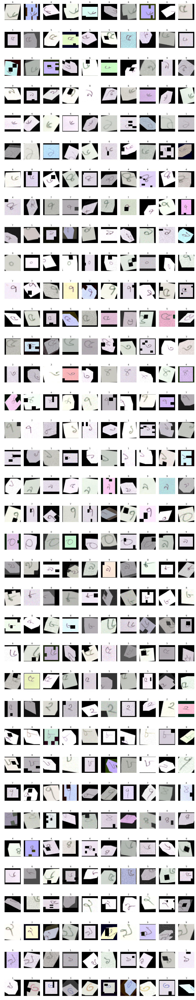

In [49]:
X_sample = X_train_a[:40]
Y_sample = y_train_a[:40]

# checking the functions

#(augmented, y_augmented) = dilate_images( X_sample, Y_sample)
(augmented, y_augmented) = augment_data( X_sample, Y_sample)

print(y_augmented)
imshow_group(augmented,to_categorical(y_augmented) ) 


# Train and Validate

In [ ]:
(X_train_a_augmented, Y_train_a_augmented ) = augment_data( X_train_a, y_train_a)
(X_train_c_augmented, Y_train_c_augmented ) = augment_data( X_train_c, y_train_c)
(X_train_b_augmented, Y_train_b_augmented ) = augment_data( X_train_b, y_train_b)

X_train_augmented = np.concatenate( (X_train, X_train_a_augmented, X_train_c_augmented, X_train_b_augmented), axis = 0)
Y_train_augmented = np.concatenate( (y_train, Y_train_a_augmented, Y_train_c_augmented, Y_train_b_augmented), axis = 0)
Y_train_augmented = to_categorical(Y_train_augmented,10)

print (X_train_augmented.shape)
print (Y_train_augmented.shape)



In [ ]:
imshow_group(X_train_augmented[-40:],Y_train_augmented[-40:] ) 

In [ ]:

path_model='model_simple_keras_starter_vgg16.h5' # save model at this location after each epoch
K.tensorflow_backend.clear_session() # destroys the current graph and builds a new one
model=get_model() # create the model
model.load_weights(path_model)
K.set_value(model.optimizer.lr,1e-2) # set the learning rate

h=model.fit(x=X_train_augmented,     
            y=Y_train_augmented, 
            batch_size=128, 
            # train the model on 50 epochs
            epochs=50, 
            verbose=1, 
            validation_data=(X_val,y_val_aug),
            shuffle=True,
            callbacks=[
                ModelCheckpoint(filepath=path_model),
            ]
            )


In [6]:
# model has to be in the same folder as the script
path_model='vgg16_distorted_aug.h5'
model = load_model(path_model)

NameError: name 'load_model' is not defined

In [274]:
model.load_weights(path_model)

# Make Predictions on Test Set

(17626, 48, 48, 3)


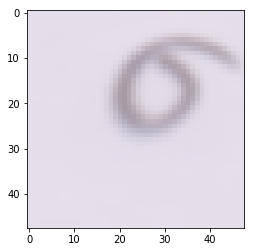

In [105]:
'''
def tta( X_values, the_model ):
    predictions = []
    for x in X_values:
        local_prediction = np.zeros(10)
        augmented_x, dummy_y = augment_data( x.reshape(1,28,28,3), np.zeros(1))
        augmented_x = np.concatenate( (x.reshape(1,28,28,3), augmented_x), axis =0 )
        plt.imshow( x.reshape(28,28,3))
        augmented_predictions = model.predict( augmented_x )
        for aug_pred in augmented_predictions:
            index = np.argmax( aug_pred )
            local_prediction[index] =local_prediction[index] + 1
        predictions.append( np.argmax( local_prediction ))
    return to_categorical( np.asarray( predictions ) )
predictions = tta( X_test_all[1:3], model)
'''
# for debugging
print(X_test_all.shape)
# plot an image
plt.imshow(X_test_all[15385])
plt.show()

# Test time augmentation

In [270]:
# THIS CELL IS EXPERIMENTED FOR A SINGLE IMAGE AUGMENTATION AND PREDICTION
# BEWARE OF MESSY PROGRAM!!!!!

# take a test image input in A
A = X_test_all[100]

# different augmentations performed on A
Aug1 = seq.augment_images(A.reshape(1,RESIZE_DIM,RESIZE_DIM,3))
Aug2 = seq2.augment_images(A.reshape(1,RESIZE_DIM,RESIZE_DIM,3))
Aug3 = seq3.augment_images(A.reshape(1,RESIZE_DIM,RESIZE_DIM,3))

# reshaped to for input in model
A_out_1 = Aug1.reshape(RESIZE_DIM,RESIZE_DIM,3)
A_out_2 = Aug2.reshape(RESIZE_DIM,RESIZE_DIM,3)
A_out_3 = Aug3.reshape(RESIZE_DIM,RESIZE_DIM,3)

# different predictoins on diff aug image

y_test1 = model.predict(A_out_1[None,:,:,:])
y_test2 = model.predict(A_out_2[None,:,:,:])
y_test3 = model.predict(A_out_3[None,:,:,:])

#probablilty class 
y_test = .4*y_test1 + .2*y_test2 + .2*y_test3
#print(y_test1)
#print(np.amax(y_test1, axis=0))

# select class with highest probability
y_index = np.argmax(y_test1,axis=1)


count = []
count.append(y_index)

#count = np.asarray(count)
#y_index.tolist()

#count = np.array(count.tolist())
#print(count)
count = np.concatenate(count)
print(type(count))

x = [1,2,3,5,5,5,1,2,1,3,6,4,4,4,4,4,4,4,4,4,4]
a = np.asarray(x)
counts = np.bincount(a)
#print(np.argmax(counts))

#print(type(y_index))
#print(type(y_index))

#print(count.astype(int))

#print(y_test.shape)
#plt.imshow(A_out_3)
#plt.show()


<class 'numpy.ndarray'>


In [275]:
# INITAL CODE FOR TEST TIME AUGMENTATION

def tta(X_tta):
    y_index = []
    B = []
    x = len(X_tta)
    dummy = 5
    for t in range(x): 
        A = X_tta[t]
        Aug1 = seq.augment_images(A.reshape(1,RESIZE_DIM,RESIZE_DIM,3))
        Aug2 = seq2.augment_images(A.reshape(1,RESIZE_DIM,RESIZE_DIM,3))
        Aug3 = seq3.augment_images(A.reshape(1,RESIZE_DIM,RESIZE_DIM,3))
        
        A_out_1 = Aug1.reshape(RESIZE_DIM,RESIZE_DIM,3)
        A_out_2 = Aug2.reshape(RESIZE_DIM,RESIZE_DIM,3)
        A_out_3 = Aug3.reshape(RESIZE_DIM,RESIZE_DIM,3)
        
        y_test1 = model.predict(A_out_1[None,:,:,:])
        y_test2 = model.predict(A_out_2[None,:,:,:])
        y_test3 = model.predict(A_out_3[None,:,:,:])
        y_test4 = model.predict(A[None,:,:,:])
        
        # change the params in the weight files for minor changes in the performance
        y_test = .2*y_test1 + .2*y_test2 + .2*y_test3 + .4*y_test4
        B.append(y_test)
        
        #print(type(y_test))
        #print(type(B))
    
    y_index=np.concatenate(B)
    #print(y_test)
    return y_index

label_pred = tta(X_test_all)
label_pred.shape


(17626, 10)

# For debugging only

In [123]:
#predictions_prob.shape
print(X_test_all.shape)

# output shape from time-test function should be this!
print(predictions_prob.shape)
print(label_pred.shape)

(17626, 48, 48, 3)
(17626, 10)
(17626, 10)


In [92]:
predictions_prob=model.predict(X_test_all) # get predictions for all the testing data

In [93]:
n_sample=200
np.random.seed(42)
ind=np.random.randint(0,len(X_test_all), size=n_sample)

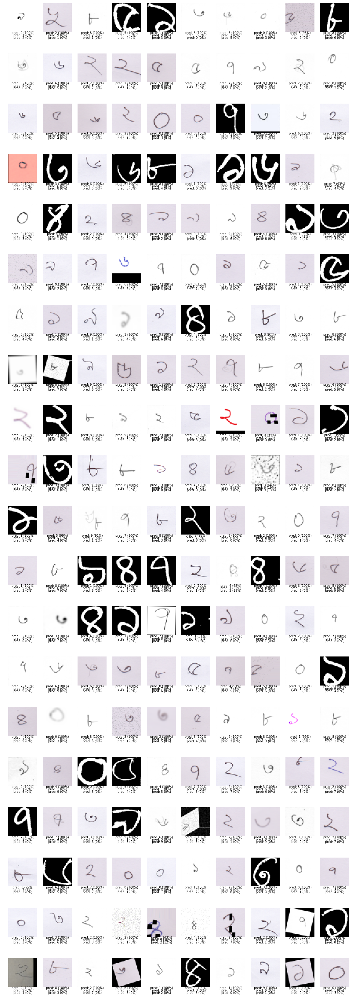

In [94]:
imshow_group(X=X_test_all[ind],y=None,y_pred=predictions_prob[ind], phase='prediction')

# Create Submission

In [264]:
# generate lables for non tta code
labels=[np.argmax(pred) for pred in predictions_prob]

In [276]:
# for tta
labels=[np.argmax(pred) for pred in label_pred]

In [277]:
keys=[get_key(path) for path in paths_test_all ]

In [278]:
create_submission(predictions=labels,keys=keys,path='vgg_last_sub.csv')

In [26]:
X_test_e.shape

(2970, 48, 48, 3)

In [30]:
predictions_prob_e=model.predict(X_test_e)
imshow_group(X=X_test_e[:len(X_test_e)],y=None,y_pred=predictions_prob_e[:len(X_test_e)], phase='prediction')

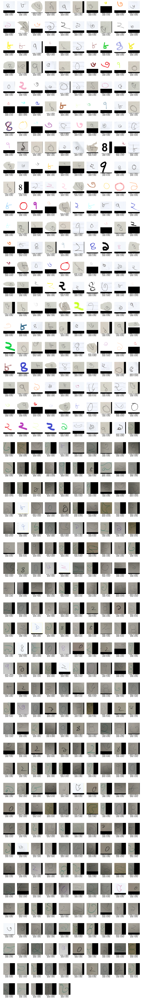

In [31]:
predictions_prob_f=model.predict(X_test_f)
imshow_group(X=X_test_f[:len(X_test_f)],y=None,y_pred=predictions_prob_f[:len(X_test_f)], phase='prediction')

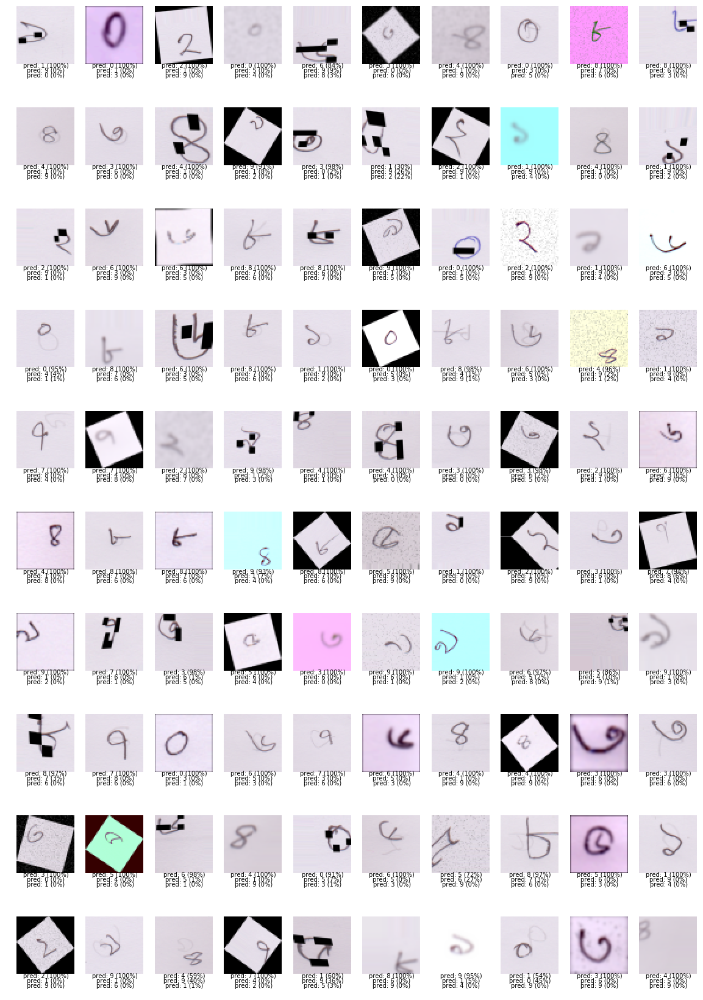

In [36]:
predictions_prob_auga=model.predict(X_test_auga)
imshow_group(X=X_test_auga[:100],y=None,y_pred=predictions_prob_auga[:100], phase='prediction')